In [305]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
from numba import njit
%matplotlib inline


def gauss(x, loc=0, sigma=1):
    return np.exp(-(x - loc) ** 2 / (2 * sigma * sigma)) / (sigma * np.sqrt(2 * np.pi))


def gauss2D(x, y, loc=0, sigma=1):
    return np.exp(-((x - loc) ** 2 + (y - loc) ** 2) / (2 * sigma * sigma)) / (sigma * np.sqrt(2 * np.pi))
    
# mpl.rc_params()['figure.figsize'] = (10, 10)

mpl.rcParams['figure.figsize'] = (10, 7)

@njit(fastmath=True)
def evolve1D(u, C2):
    Nt = u.shape[0] - 1
    Nx = u.shape[1] - 1
    
    for i in range(1, Nt):
        for j in range(0, Nx + 1):
            # apply Neumann condition
            jp1 = j + 1 if j < Nx else j - 1
            jm1 = j - 1 if j > 0 else j + 1
            
            u[i+1, j] = 2 * u[i, j] - u[i-1, j] + C2 * (u[i, jp1] - 2*u[i, j] + u[i, jm1])

@njit(fastmath=True)
def evolve2D(u, C2x, C2y):
    Nt = u.shape[0] - 1
    Nx = u.shape[1] - 1
    Ny = u.shape[2] - 1
    
    for t in range(1, Nt):
        for i in range(0, Nx + 1):
            for j in range(0, Ny + 1):
                # apply Neumann condition
                jp1 = j + 1 if j < Ny else j - 1
                jm1 = j - 1 if j > 0 else j + 1
                ip1 = i + 1 if i < Nx else i - 1
                im1 = i - 1 if i > 0 else i + 1

                u[t+1, i, j] = 2 * u[t, i, j] - u[t-1, i, j] \
                                + C2x * (u[t, ip1, j] - 2*u[t, i, j] + u[t, im1, j]) \
                                + C2y * (u[t, i, jp1] - 2*u[t, i, j] + u[t, i, jm1])
    
def plot_mat(x, y, data, max_val=None, fpath=None, dpi=200, transparent=True):
    m = max(np.abs(data.max()), np.abs(data.min())) if max_val is None else max_val
    plt.pcolormesh(x, y, data, cmap='seismic', vmax=m, vmin=-m)
    plt.colorbar()
    plt.ylabel('y')
    plt.xlabel('x')

    plt.gca().invert_yaxis()
    if fpath:
        plt.savefig(fpath, transparent=transparent, dpi=dpi)
    plt.show()


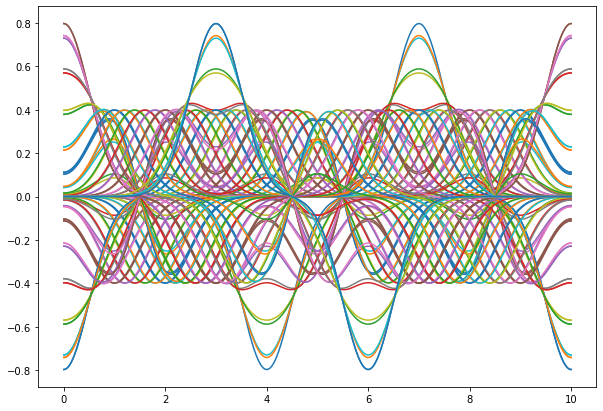

In [156]:
dx = 0.1
dt = 0.1
c = 1

t = np.arange(0, 20 + dt, dt)
x = np.arange(0, 10 + dx, dx)

C = c * dt / dx # Courant number
Nt = len(t)-1
Nx = len(x) - 1

C2 = C**2 # Help variable in the scheme

# result matrix

u = np.zeros((t.shape[0], x.shape[0]), dtype=np.float64)


# Set initial condition u(x,0) = I(x)
u[0] = gauss(x, 3, 0.5) - gauss(x, 6, 0.5) 
# u[0] = np.sin(2*np.pi / 10 * x)
u[0, 0] = 0
u[0, -1] = 0


# Apply special formula for first step, incorporating du/dt=0
u[1, 1:-1] = u[0, 1:-1] - 0.5 * C2 * (u[0, 2:] - 2 * u[0, 1:-1] + u[0, :-2])

evolve1D(u, C2)

# # evolve
# for i in range(1, Nt):
#     for j in range(1, Nx):
#         u[i+1, j] = 2 * u[i, j] - u[i-1, j] + C2 * (u[i, j+1] - 2*u[i, j] + u[i, j-1])
# #         u[i+1, 1:-1] = 2 * u[i, 1:-1] - u[i-1, 1:-1] + C2 * (u[i, 2:] - 2 * u[i, 1:-1] + u[i, :-2])


plt.plot(x, u[::20].T)
plt.show()

In [344]:
dx = 0.05
dy = 0.05
dt = 0.01
c = 3

t = np.linspace(0, 20, int(20 / dt + 1))
x = np.arange(0, 10 + dx, dx)
y = np.arange(0, 10 + dy, dy)

# xx, yy = np.meshgrid(x, y)

# plot_mat(x, y, data_gauss)

Cx = c * dt / dx # Courant number
Cy = c * dt / dy # Courant number
C2x = Cx**2 
C2y = Cy**2 

# result matrix
u = np.zeros((t.shape[0], x.shape[0], y.shape[0]), dtype=np.float64)

# Set initial condition u(x,0) = I(x)
u[0] = gauss2D(x[:, None], y[None, :], 2, 0.2) - gauss2D(x[:, None], y[None, :], 6, 0.3)
# u[0, 0] = 0
# u[0, -1] = 0

# Apply special formula for first step, incorporating du/dt=0
u[1, 1:-1, 1:-1] = u[0, 1:-1, 1:-1] - 0.5 * C2x * (u[0, 2:, 1:-1] - 2 * u[0, 1:-1, 1:-1] + u[0, :-2, 1:-1]) - 0.5 * C2y * (u[0, 1:-1, 2:] - 2 * u[0, 1:-1, 1:-1] + u[0, 1:-1, :-2])

evolve2D(u, C2x, C2y)

# plot_mat(x, y, u[3])
# plt.plot(x, u[::20].T)
# plt.show()

u.shape

(2001, 201, 201)

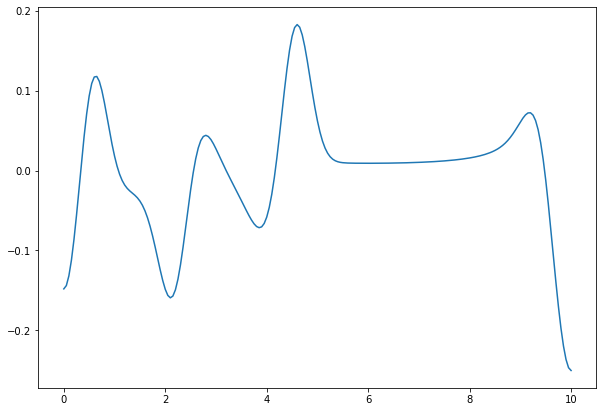

In [345]:
plt.plot(x, u[130, :, y.shape[0] // 2])
plt.show()

<ipython-input-305-718f149b50a0>:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(x, y, data, cmap='seismic', vmax=m, vmin=-m)


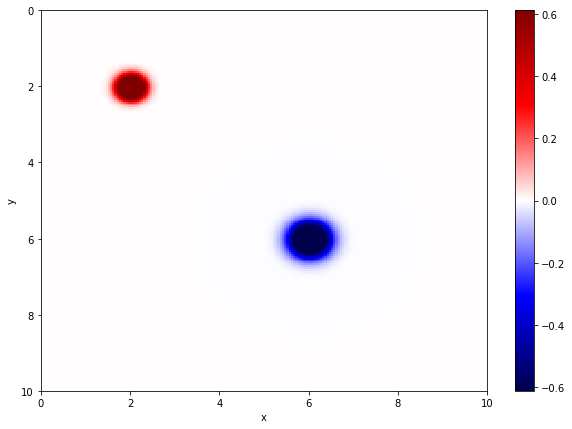

In [350]:
mval = max(np.abs(u.max()), np.abs(u.min()))
plot_mat(x, y, u[1], mval * 0.3)

<ipython-input-305-718f149b50a0>:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(x, y, data, cmap='seismic', vmax=m, vmin=-m)


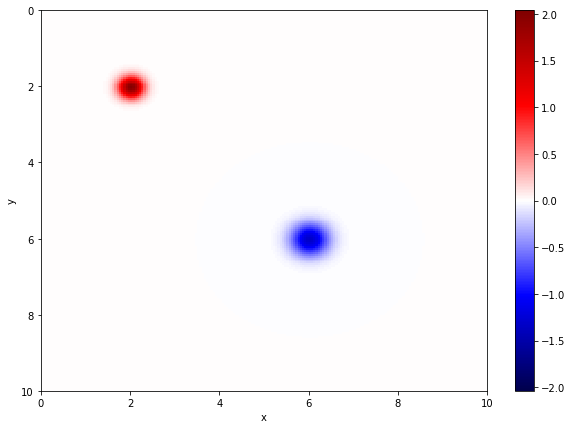

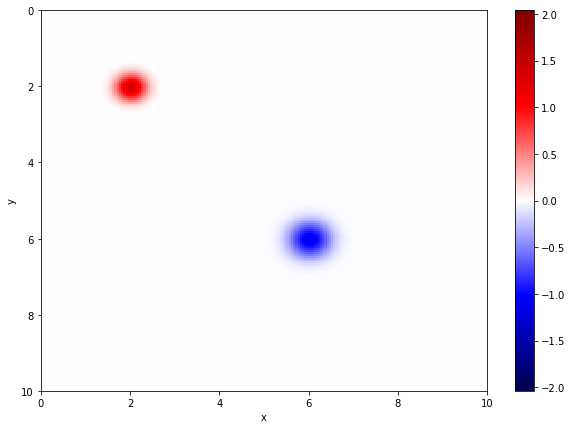

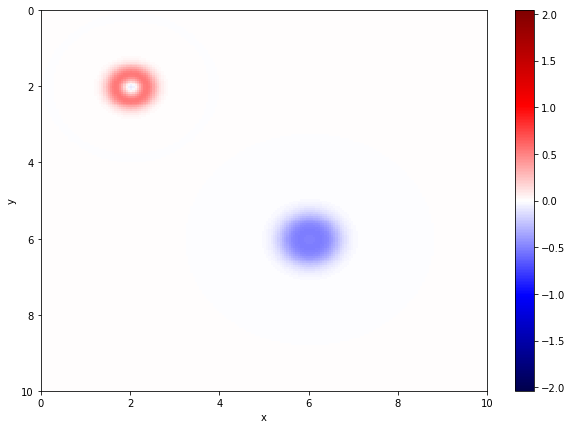

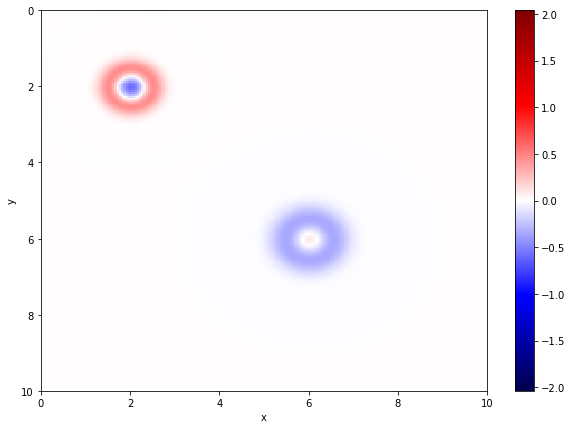

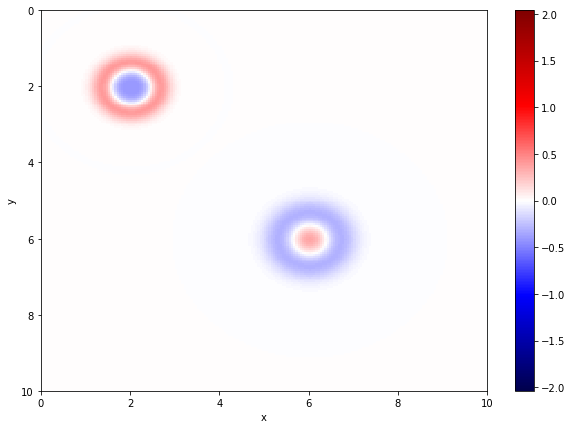

...

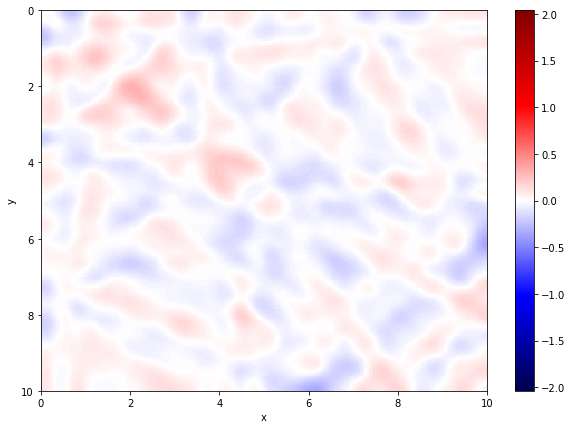

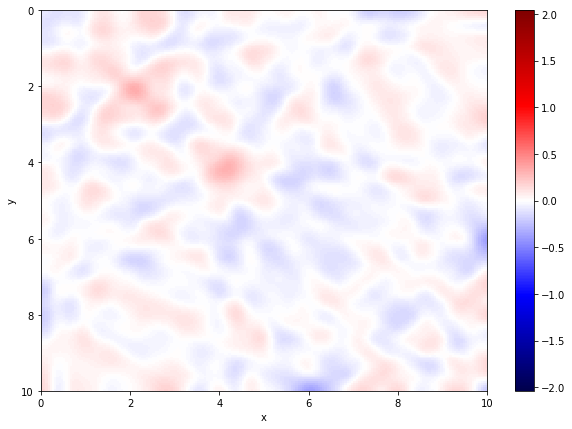

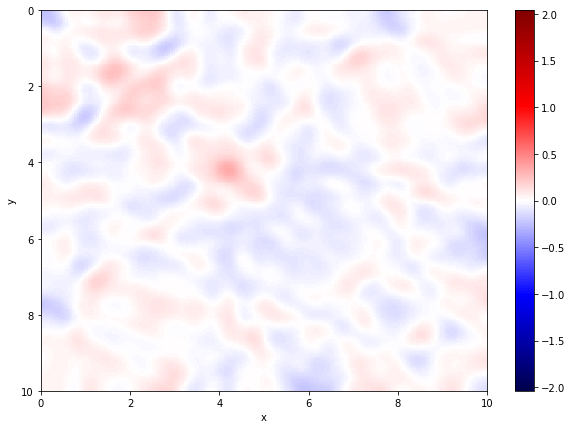

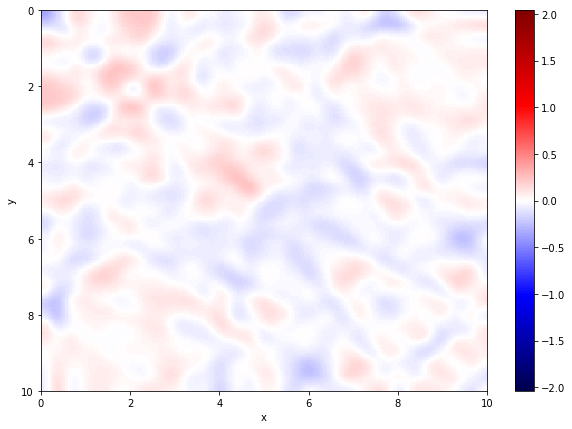

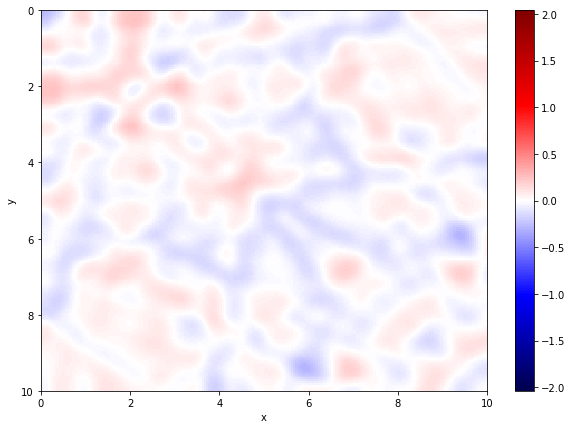

In [351]:
step = 5
for i in range(0, len(t), step):
    plt.savefig(f'./img2D/{i//step:03}.png', transparent=True, dpi=200)
    plot_mat(x, y, u[i], mval, fpath=f'./img2D/{i//step:03}.png')


In [352]:
# https://stackoverflow.com/questions/46036971/gif-creation-with-imagemagick-convert-images-are-overlapping
delay = 5
_dir = "img2D"
command = f"\"C:\\Program Files\\ImageMagick-7.0.10-Q16-HDRI\\magick.exe\" convert -dispose previous -loop 0 -delay {delay} {_dir}\\*.png {_dir}\\out.gif"
os.popen(command)